# Test de `potato_pixels_rgb_img` (Roboflow + Supervision)

Aquest notebook serveix per testejar visualment i funcionalment la nova versió de `potato_pixels_rgb_img` basada en **roboflow + supervision**, amb control real de *confidence*.

In [1]:
import os
import sys
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

assert "ROBOFLOW_API_KEY" in os.environ, "Falta definir ROBOFLOW_API_KEY"

In [2]:
current_path = Path().resolve()
TARGET_ROOT_NAME = "potato-dry-matter-optics-ml"

while current_path.name != TARGET_ROOT_NAME and current_path.parent != current_path:
    current_path = current_path.parent

if current_path.name != TARGET_ROOT_NAME:
    raise RuntimeError(
        f"No s'ha trobat la carpeta '{TARGET_ROOT_NAME}' pujant des del directori actual: {Path().resolve()}"
    )

project_root = current_path
sys.path.append(str(project_root))

## Import de la funció a testejar

Ajusta el path segons on tinguis definida la funció.

In [3]:
from src.raw_image_treatment import potato_pixels_rgb_img, potato_filter_extreme_colours

## Selecció d'imatge de test

Image exists: True


(-0.5, 2987.5, 2047.5, -0.5)

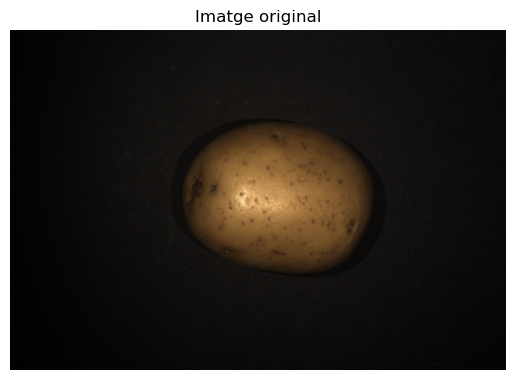

In [4]:
PROJECT_ROOT = current_path
IMAGE_PATH = PROJECT_ROOT / "data/input/raw/raw_images/test_1/p1_21.png"
print("Image exists:", IMAGE_PATH.exists())

pil_img = Image.open(IMAGE_PATH).convert("RGB")
plt.imshow(pil_img)
plt.title("Imatge original")
plt.axis("off")

In [5]:
from PIL import Image
img = Image.open(IMAGE_PATH)
print(img.format, img.mode)  # PNG RGBA  (en el caso problemático)


PNG RGBA


## Execució de la funció (confidence = 0.70)

In [6]:
cropped_img, vis_img = potato_pixels_rgb_img(
    IMAGE_PATH,
    margin=35,
)

## Resultats

(-0.5, 2987.5, 2047.5, -0.5)

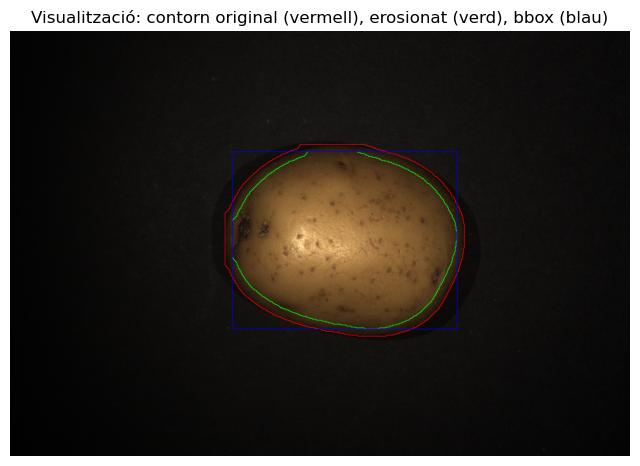

In [7]:
plt.figure(figsize=(8, 6))
plt.imshow(vis_img)
plt.title("Visualització: contorn original (vermell), erosionat (verd), bbox (blau)")
plt.axis("off")

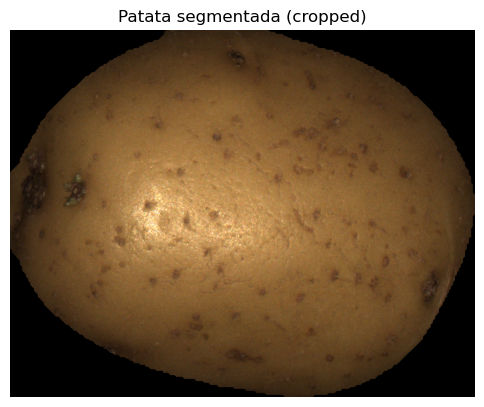

In [8]:
if cropped_img is None:
    print("❌ No s'ha detectat cap patata")
else:
    plt.figure(figsize=(6, 6))
    plt.imshow(cropped_img)
    plt.title("Patata segmentada (cropped)")
    plt.axis("off")

## Totes les patates

[35/35] Processant p2_11.png


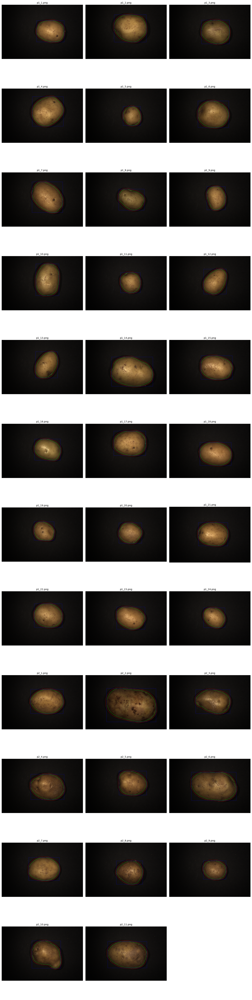

In [9]:
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import clear_output

# ------------------------------------------------------------
# Configuració
# ------------------------------------------------------------
IMAGE_DIR = PROJECT_ROOT / "data/input/raw/raw_images/test_1/"
MARGIN = 35
N_COLS = 3

# construir llista de fitxers
files = (
    [IMAGE_DIR / f"p1_{i}.png" for i in range(1, 25)] +
    [IMAGE_DIR / f"p2_{j}.png" for j in range(1, 12)]
)

files = [f for f in files if f.exists()]
N = len(files)

print(f"🔍 Total d'imatges trobades: {N}")

# ------------------------------------------------------------
# Processament
# ------------------------------------------------------------
vis_images = []

for k, img_path in enumerate(files, start=1):
    clear_output(wait=True)
    print(f"[{k}/{N}] Processant {img_path.name}")

    cropped_img, vis_img = potato_pixels_rgb_img(
        img_path,
        margin=MARGIN,      # confidence = default
    )

    vis_images.append((img_path.name, vis_img))

# ------------------------------------------------------------
# Visualització en una sola figura
# ------------------------------------------------------------
if len(vis_images) == 0:
    print("⚠️ No s'ha processat cap imatge (vis_images està buit). Revisa IMAGE_DIR i els noms dels fitxers.")
else:
    N_ROWS = (len(vis_images) + N_COLS - 1) // N_COLS
    fig, axes = plt.subplots(
        N_ROWS,
        N_COLS,
        figsize=(5 * N_COLS, 5 * N_ROWS)
    )

    axes = axes.flatten()

    for ax, (name, img) in zip(axes, vis_images):
        ax.imshow(img)
        ax.set_title(name, fontsize=10)
        ax.axis("off")

    for ax in axes[len(vis_images):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()